In [1]:
import torch
import cv2
import os
import glob
from torch.utils.data import Dataset
import random
import numpy as np

from torchvision import transforms
from PIL import Image


class Gopro_Loader(Dataset):
    def __init__(self, data_path, transform=None):
        self.data_path = data_path
        self.transform = transform
        
        # 讀取所有影像的檔名
        self.imgs = glob.glob(os.path.join(data_path, 'blur/*.png'))

    def __getitem__(self, idx):
        # 讀取影像
        img_path = self.imgs[idx]
        label_path = img_path.replace("blur", "sharp")
        
        # 讀取標籤
        img = Image.open(img_path)
        label = Image.open(label_path)
        
        
        if self.transform:
            img = self.transform(img)
            label = self.transform(label)
        

        return img, label

    def __len__(self):
        return len(self.imgs)

In [5]:
from torchvision import transforms
from torch.utils.data import DataLoader

# 定義數據變換
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# 創建數據集
train_set = Gopro_Loader(data_path="dataset_gopro/train", transform=transform)

# 創建數據加載器
train_loader = DataLoader(train_set, batch_size=4, shuffle=True)

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


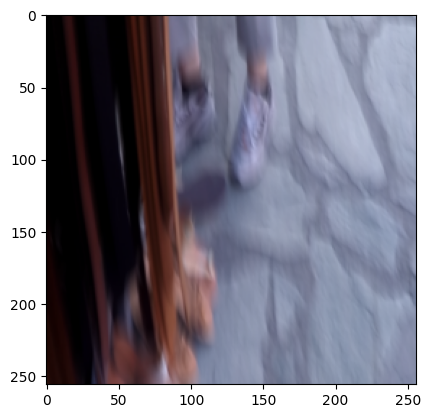

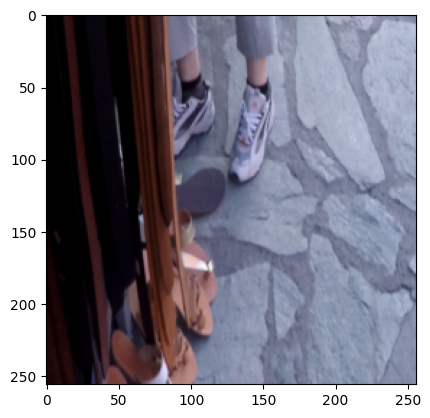

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


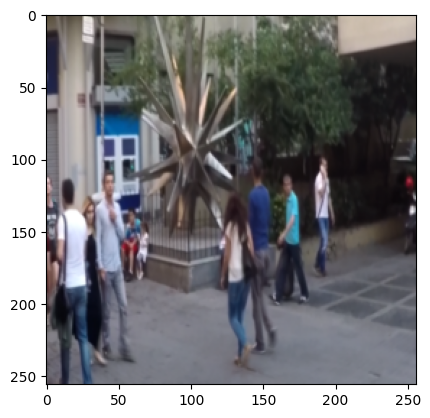

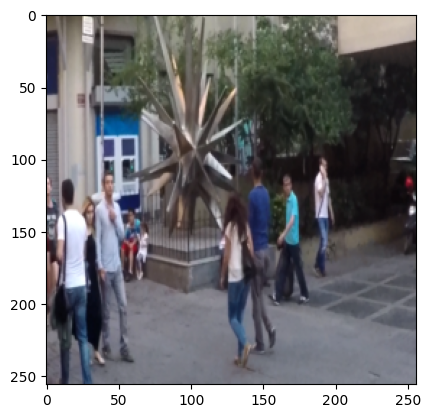

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


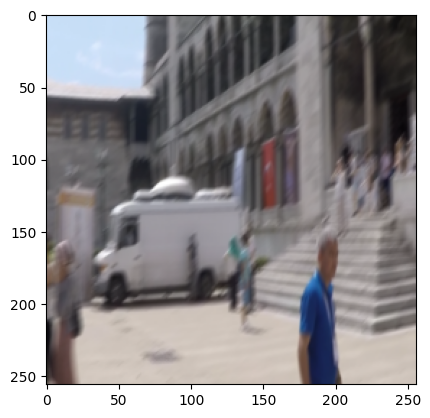

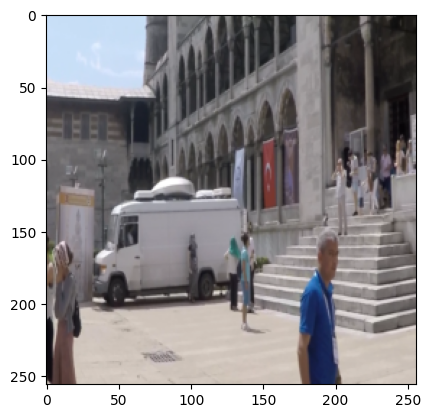

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


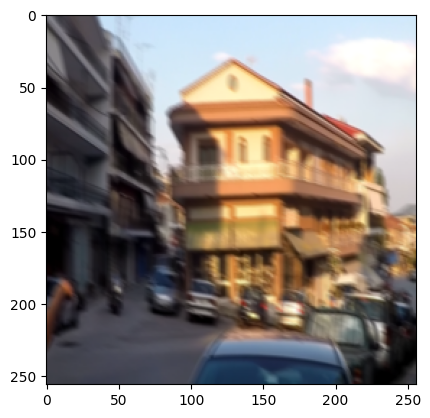

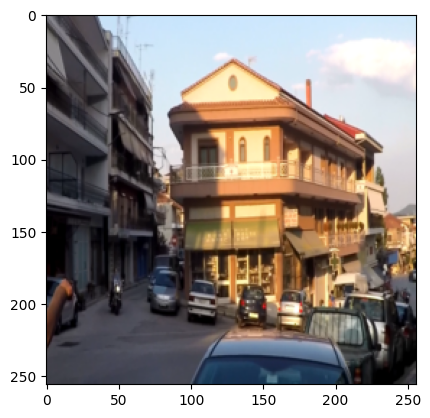

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


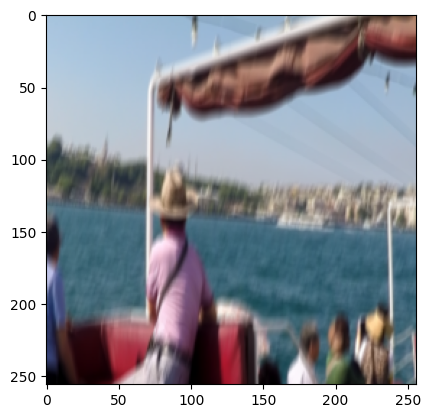

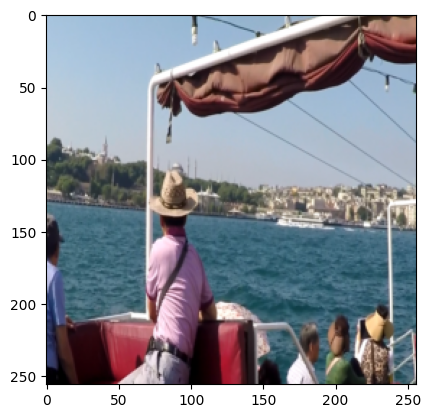

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


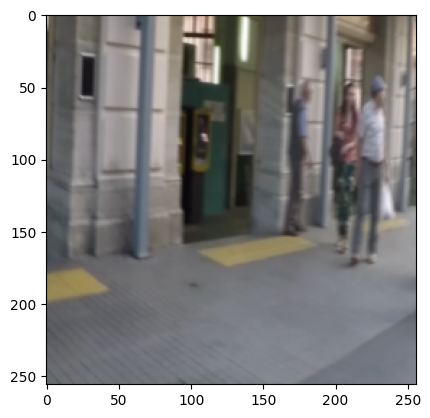

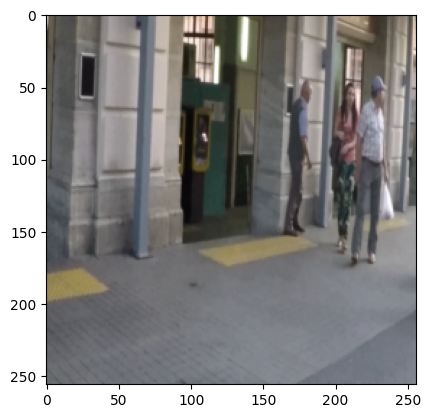

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


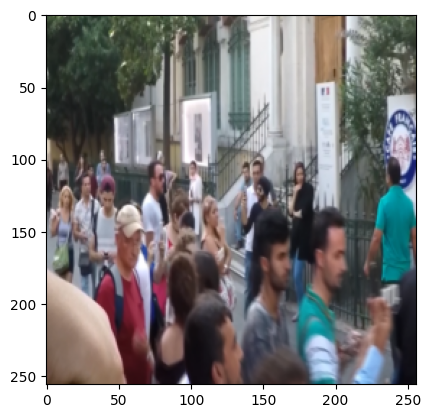

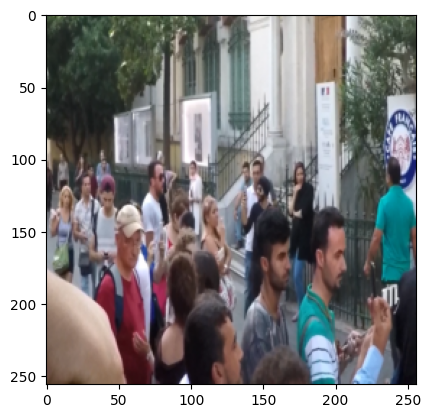

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


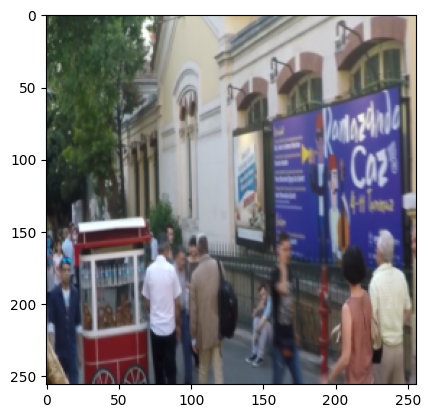

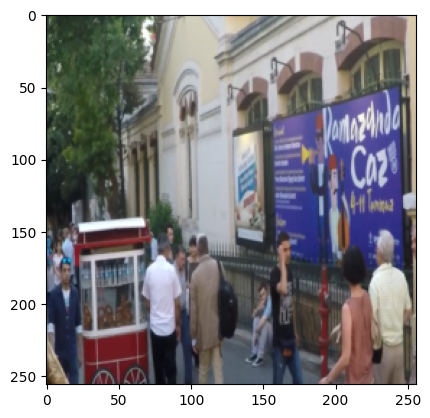

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


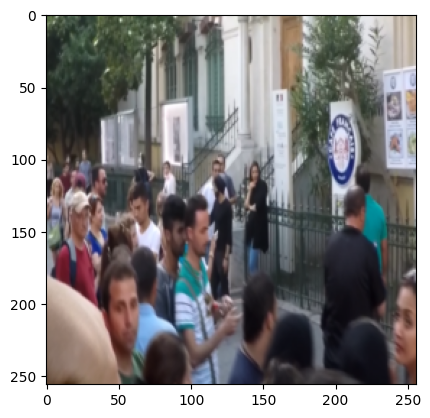

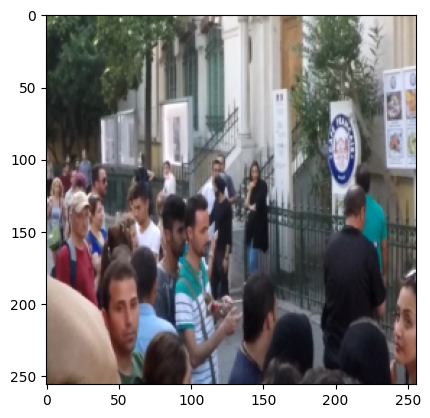

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


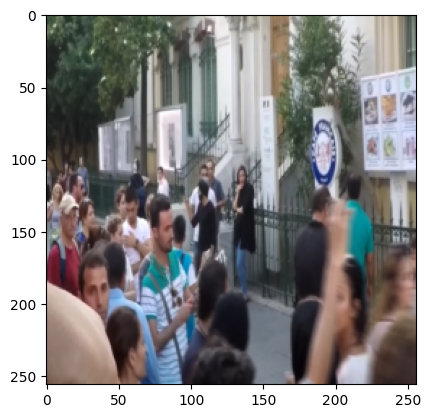

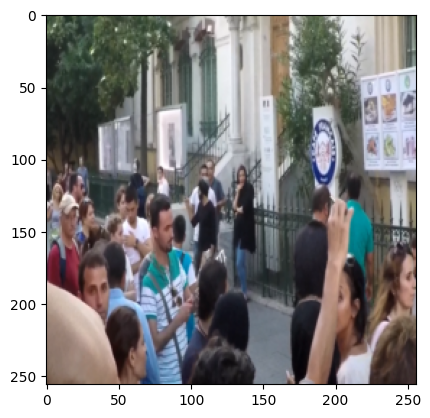

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


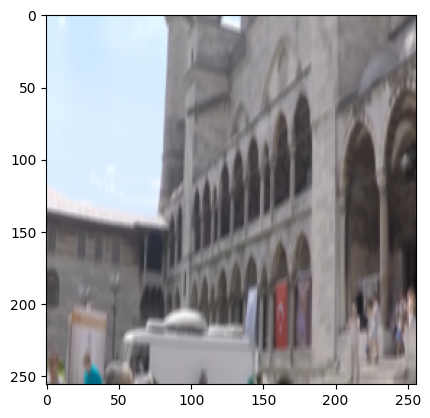

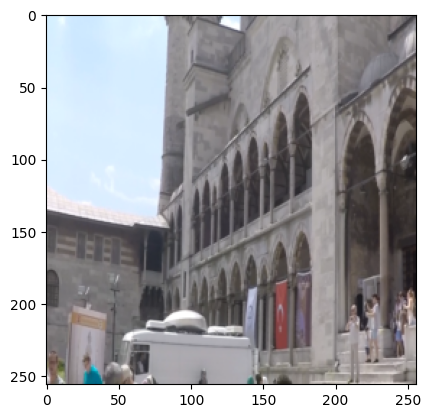

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


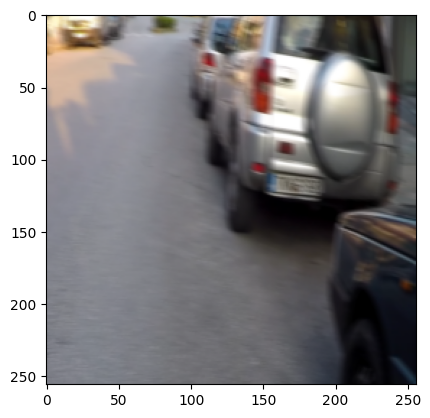

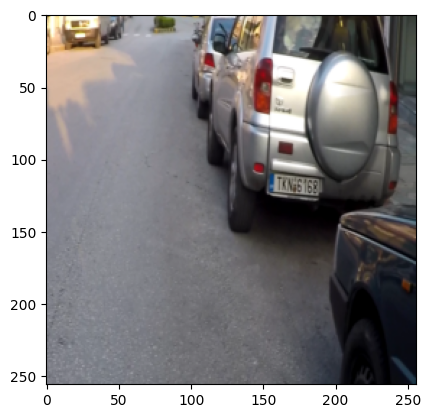

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


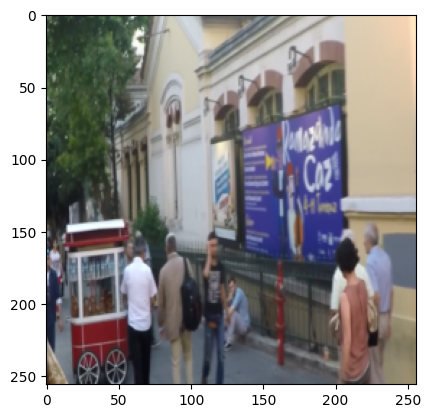

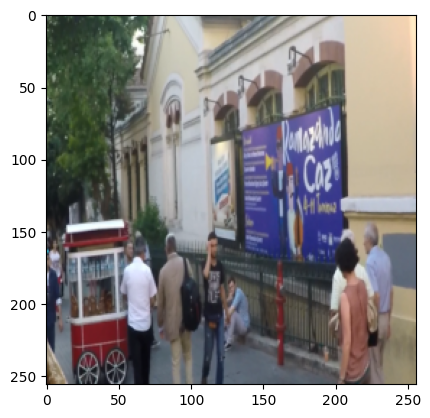

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


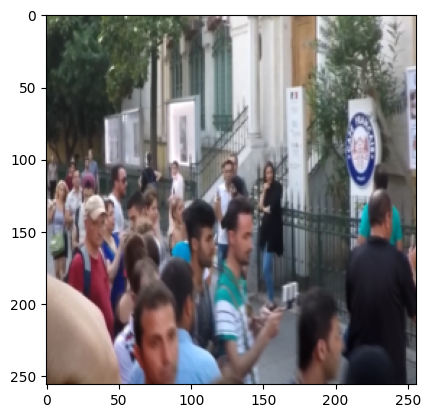

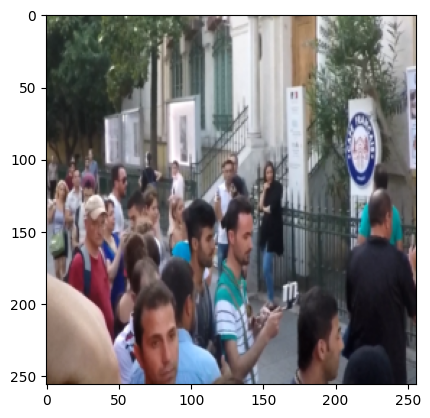

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


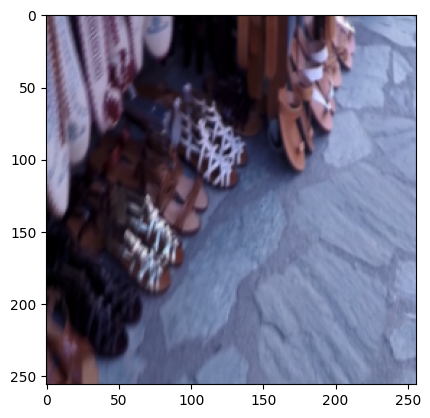

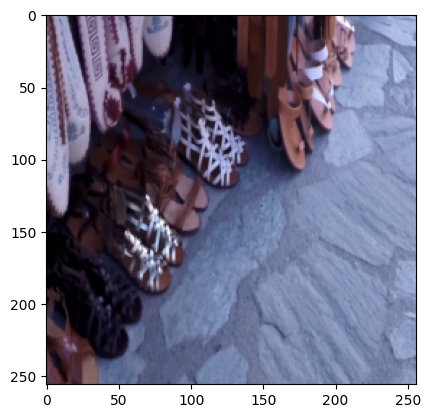

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


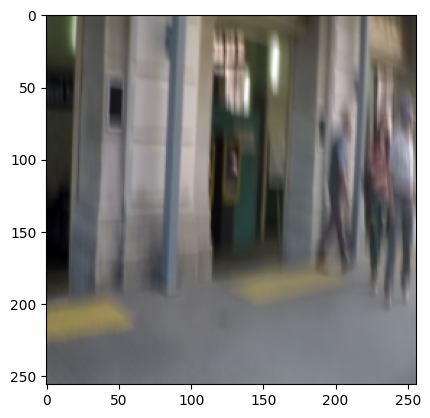

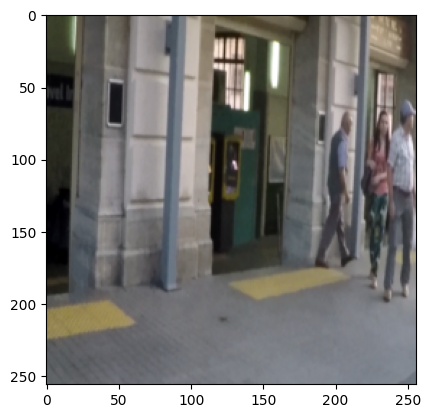

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


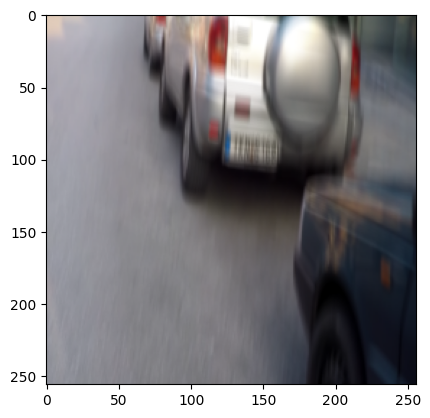

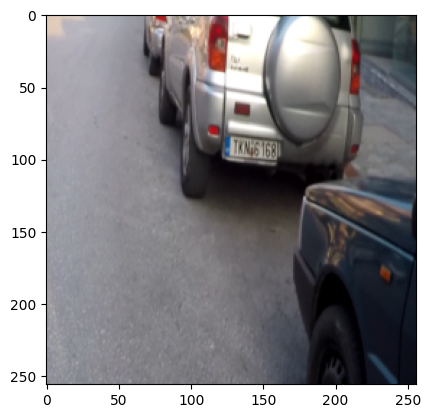

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


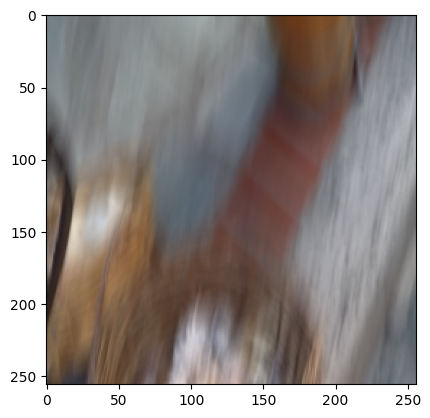

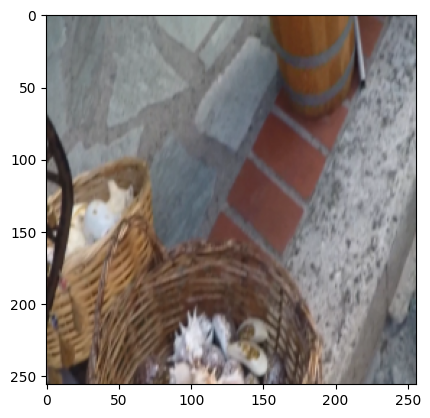

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


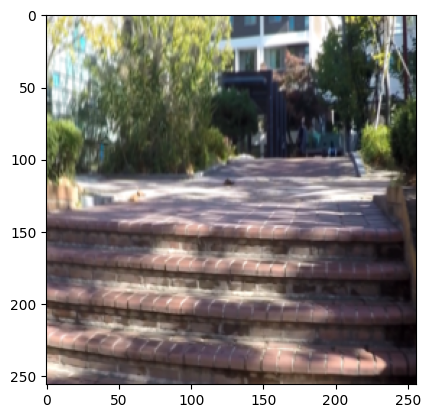

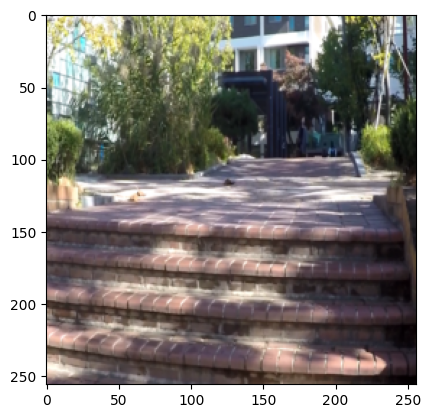

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


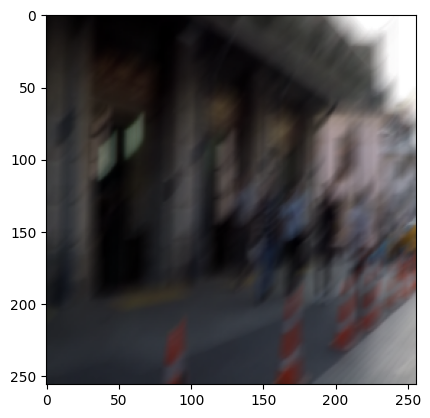

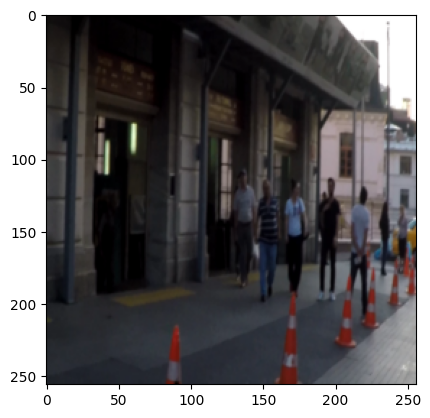

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


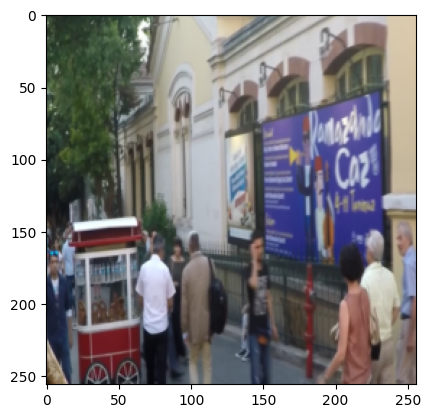

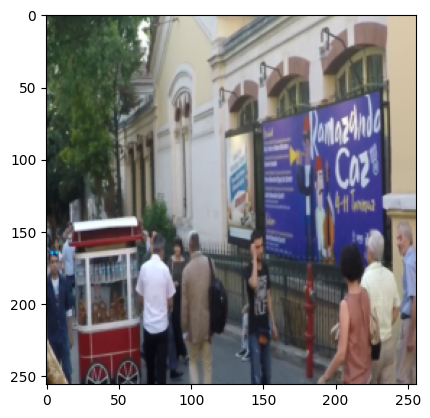

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


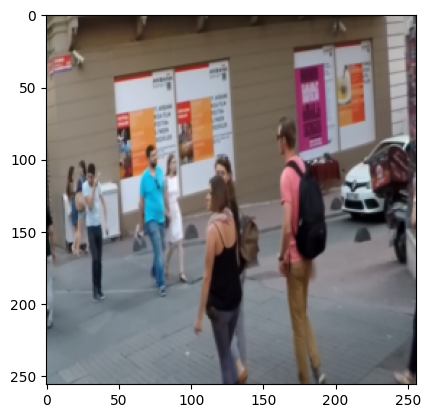

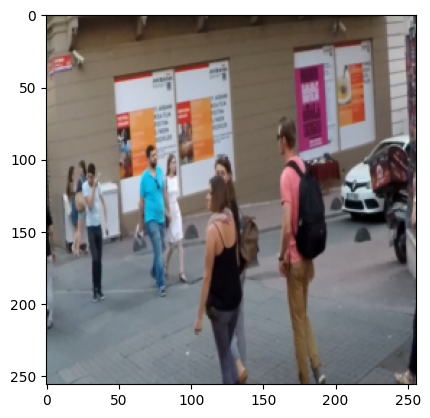

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


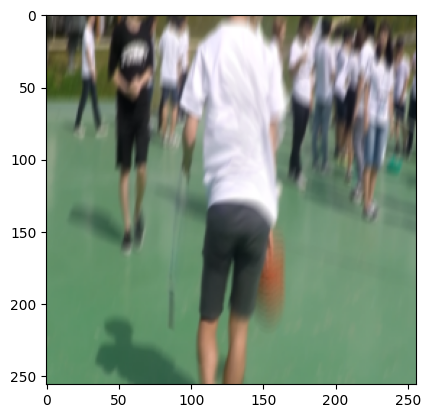

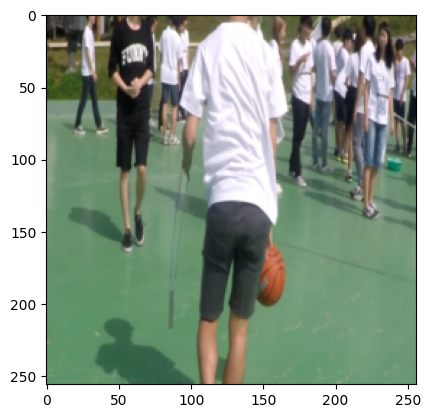

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


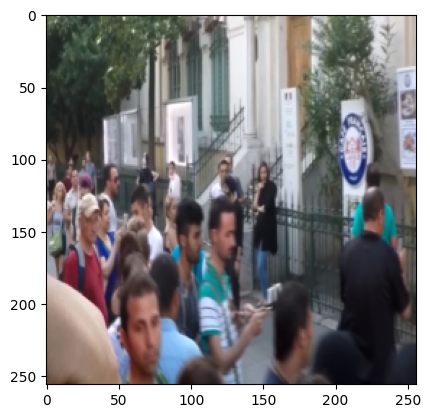

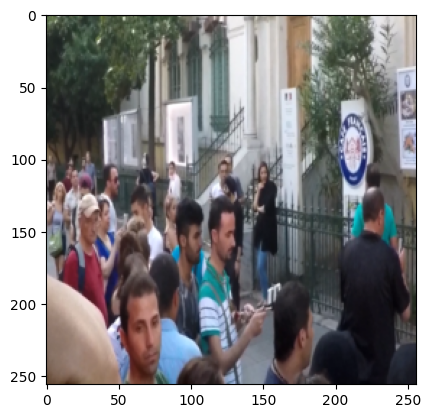

torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


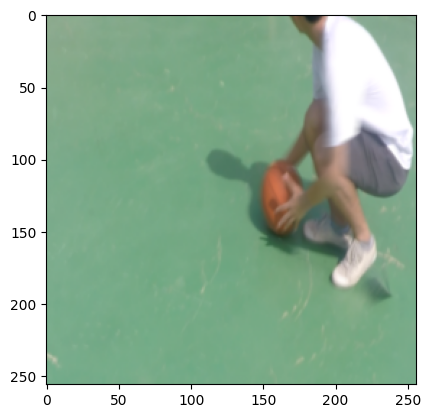

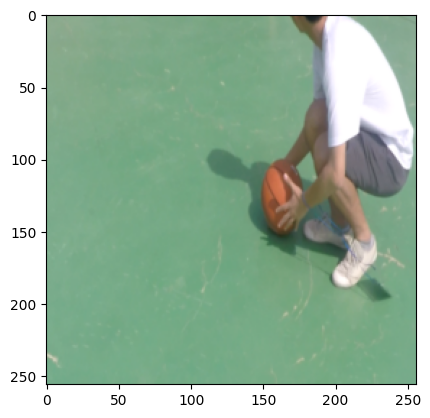

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


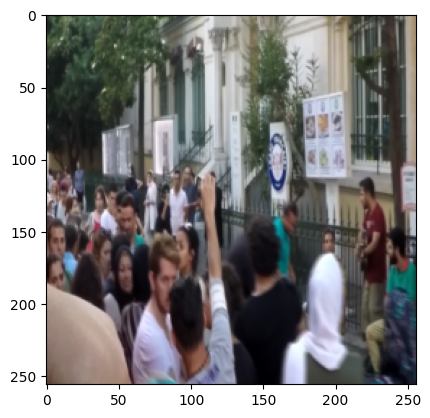

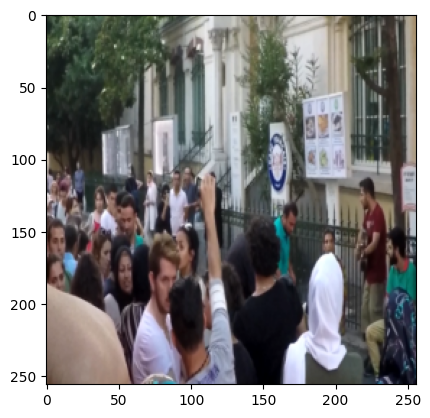

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


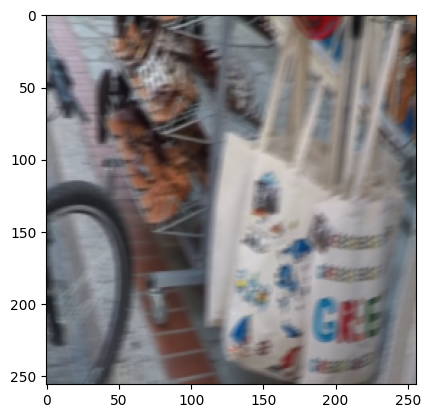

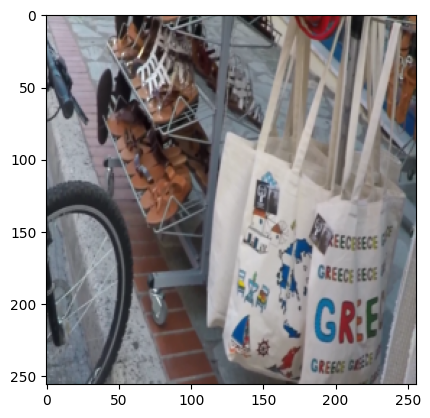

torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


KeyboardInterrupt: 

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import torch
# 檢查資料集的圖片長寬
for images, labels in train_loader:
    print(images.shape)  # 檢查圖片張數和通道數
    print(labels.shape)  # 檢查圖片張數和通道數
    for img, lab in zip(images, labels):
        print(img.shape)  # 檢查圖片的長寬
        print(lab.shape)  # 檢查圖片的長寬
        # 將torch格式的圖片轉換為numpy格式
        img_np = img.numpy().transpose(1, 2, 0)

        # 顯示圖片
        plt.imshow(img_np)
        plt.show()
        lab_np = lab.numpy().transpose(1, 2, 0)
        # 顯示圖片
        plt.imshow(lab_np)
        plt.show()

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)

        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = torch.tensor([x2.size()[2] - x1.size()[2]])
        diffX = torch.tensor([x2.size()[3] - x1.size()[3]])

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [34]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 512)
        self.up1 = Up(1024, 512, bilinear)
        self.up2 = Up(512, 256 , bilinear)
        self.up3 = Up(256, 128, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [39]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 512)
        self.up1 = Up(512, 256, bilinear)
        self.up2 = Up(256, 128 , bilinear)
        self.up3 = Up(128, 64, bilinear)
        self.up4 = Up(64, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        print("x shape:", x.shape)
        x1 = self.inc(x)
        print("x1 shape:", x1.shape)
        x2 = self.down1(x1)
        print("x2 shape:", x2.shape)
        x3 = self.down2(x2)
        print("x3 shape:", x3.shape)
        x4 = self.down3(x3)
        print("x4 shape:", x4.shape)
        x5 = self.down4(x4)
        print("x5 shape:", x5.shape)
        
        x = self.up1(x5, x4)
        print("x shape after up1:", x.shape)
        x = self.up2(x, x3)
        print("x shape after up2:", x.shape)
        x = self.up3(x, x2)
        print("x shape after up3:", x.shape)
        x = self.up4(x, x1)
        print("x shape after up4:", x.shape)
        logits = self.outc(x)
        print("logits shape:", logits.shape)
        return logits

In [40]:
model = UNet(n_channels=3, n_classes=3, bilinear=False)

# 创建一个大小为 [1, 3, 256, 256] 的张量
input_tensor = torch.rand(1, 3, 256, 256)

# 将张量传递给模型进行前向传播
output_tensor = model(input_tensor)

x shape: torch.Size([1, 3, 256, 256])
x1 shape: torch.Size([1, 64, 256, 256])
x2 shape: torch.Size([1, 128, 128, 128])
x3 shape: torch.Size([1, 256, 64, 64])
x4 shape: torch.Size([1, 512, 32, 32])
x5 shape: torch.Size([1, 512, 16, 16])


RuntimeError: Given transposed=1, weight of size [256, 256, 2, 2], expected input[1, 512, 16, 16] to have 256 channels, but got 512 channels instead

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim

def train_net(net, train_loader, val_loader, num_epochs=10, learning_rate=0.001, device='cpu'):
    # 将模型移动到指定设备
    net.to(device)
    
    # 定义损失函数和优化器
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(net.parameters(), lr=learning_rate)
    
    best_loss = float('inf')
    
    # 训练模型
    for epoch in range(num_epochs):
        net.train() # 将模型设为训练模式
        train_loss = 0.0
        
        for i, data in enumerate(train_loader):
            inputs, labels = data[0].to(device), data[1].to(device)
            
            # 将梯度清零
            optimizer.zero_grad()
            
            # 前向传播，计算预测结果和损失
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            # 保存loss值最小的网络参数
            if loss < best_loss:
                best_loss = loss
                torch.save(net.state_dict(), 'best_model.pth')
            
            # 反向传播，更新参数
            loss.backward()
            optimizer.step()
            
            # 统计损失
            train_loss += loss.item()
        
        # 在验证集上测试模型，并记录损失
        net.eval() # 将模型设为测试模式
        val_loss = 0.0
        with torch.no_grad():
            for i, data in enumerate(val_loader):
                inputs, labels = data[0].to(device), data[1].to(device)
                
                # 前向传播，计算预测结果和损失
                outputs = net(inputs)
                loss = criterion(outputs, labels)
                
                # 统计损失
                val_loss += loss.item()
                
        # 打印每个epoch的损失
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss/len(train_loader)}, Val Loss: {val_loss/len(val_loader)}")


In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

batch_size = 4
# 加载网络，图片单通道1，分类为1。
net = UNet(n_channels=3, n_classes=3, bilinear=False)

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])
# 指定训练集地址，开始训练
train_data_path = "dataset_gopro/train"
gopro_dataset = Gopro_Loader(data_path=train_data_path, transform=transform)
train_loader = torch.utils.data.DataLoader(
                                        dataset=gopro_dataset,
                                        batch_size=batch_size, 
                                        shuffle=True)

test_data_path = "dataset_gopro/eval"
gopro_test_dataset = Gopro_Loader(data_path=test_data_path, transform=transform)
val_loader = torch.utils.data.DataLoader(
                                        dataset=gopro_test_dataset,
                                        batch_size=batch_size, 
                                        shuffle=True)

train_net(net, train_loader, val_loader, num_epochs=100, learning_rate=0.0001, device=device)

RuntimeError: Given transposed=1, weight of size [512, 512, 2, 2], expected input[4, 1024, 16, 16] to have 512 channels, but got 1024 channels instead

In [6]:
from torch import optim
import torch.nn as nn
import torch

def train_net(net, device, data_path, epochs=40, batch_size=1, lr=0.00001):
    # 加载训练集
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
    ])
    isbi_dataset = Gopro_Loader(data_path=data_path, transform=transform)
    train_loader = torch.utils.data.DataLoader(dataset=isbi_dataset,
                                               batch_size=batch_size, 
                                               shuffle=True)
    # 定义RMSprop算法
    optimizer = optim.RMSprop(net.parameters(), lr=lr, weight_decay=1e-8, momentum=0.9)
    # 定义Loss算法
    criterion = nn.BCEWithLogitsLoss()
    # best_loss统计，初始化为正无穷
    best_loss = float('inf')
    # 训练epochs次
    for epoch in range(epochs):
        # 训练模式
        net.train()
        # 按照batch_size开始训练
        for image, label in train_loader:
            optimizer.zero_grad()
            # 将数据拷贝到device中
            image = image.to(device=device, dtype=torch.float32)
            label = label.to(device=device, dtype=torch.float32)
            # 使用网络参数，输出预测结果
            pred = net(image)
            print (f'pred: {pred.shape}')
            # 將預測輸出的通道數改成3
#             pred = pred.expand(-1, 3, -1, -1)
#             print (f'pred: {pred.shape}')
            print (f'label: {label.shape}')
            # 计算loss
            loss = criterion(pred, label)
            print('Loss/train', loss.item())
            # 保存loss值最小的网络参数
            if loss < best_loss:
                best_loss = loss
                torch.save(net.state_dict(), 'best_model.pth')
            # 更新参数
            loss.backward()
            optimizer.step()

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# 加载网络，图片单通道1，分类为1。
net = UNet(n_channels=3, n_classes=1)
# 将网络拷贝到deivce中
net.to(device=device)
# 指定训练集地址，开始训练
data_path = "dataset_gopro/train"
train_net(net, device, data_path)

C:\Users\zhenRong\AppData\Local\Temp\ipykernel_6304\1205209092.py:55: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
C:\Users\zhenRong\AppData\Local\Temp\ipykernel_6304\1205209092.py:56: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  diffY // 2, diffY - diffY // 2])


pred: torch.Size([1, 1, 256, 256])
label: torch.Size([1, 3, 256, 256])


ValueError: Target size (torch.Size([1, 3, 256, 256])) must be the same as input size (torch.Size([1, 1, 256, 256]))

In [7]:

from torch.utils.data import DataLoader

# 选择设备，有cuda用cuda，没有就用cpu
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# 加载网络，图片三通道，分类为1。
net = UNet(n_channels=3, n_classes=3)
# 将网络拷贝到device中
net.to(device=device)
# 加载模型参数
net.load_state_dict(torch.load('best_model.pth', map_location=device))
# 测试模式
net.eval()

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

tests_path = glob.glob('dataset_gopro/test/blur/*.png')
print (tests_path)
# 遍历所有图片
for test_path in tests_path:
    # 保存结果地址
    save_res_path = test_path.split('.')[0] + '_res.png'
    # 读取图片
    img = cv2.imread(test_path)
    print (img.shape)
    # 转为batch为1，通道为1，大小为512*512的数组
    img = img.reshape(1, 3, img.shape[0], img.shape[1])
    print (img.shape)
    # 转为tensor
    img_tensor = torch.from_numpy(img)
    
    # 将数据拷贝到device中
    image = img_tensor.to(device=device, dtype=torch.float32)
    # 使用网络参数，输出预测结果
    pred = net(image)
    print (pred.shape)
    # 將預測輸出的通道數改成3
#     pred = pred.expand(-1, 3, -1, -1)
    # 将结果拷贝回cpu
    pred = pred.cpu()
    # 处理结果
#     pred[pred >= 0.5] = 255
#     pred[pred < 0.5] = 0
    # 将Tensor转换为NumPy数组
#     pred = pred.detach().numpy()[0][0].astype('uint8')
    pred = pred.detach().cpu().numpy()

    print (pred.shape)
    # 保存图片
    save_res_path = test_path.split('.')[0] + '_res.png'
    cv2.imwrite(save_res_path, pred[0].transpose(1, 2, 0).astype('uint8'))

#     cv2.imwrite(save_res_path, pred)


['dataset_gopro/test/blur\\GOPR0871_11_01_000181.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000181_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000182.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000182_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000183.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000183_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000184.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000184_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000185.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000185_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000186.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000186_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000187.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000187_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000188.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000188_res.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000189.png', 'dataset_gopro/test/blur\\GOPR0871_11_01_000189_r

C:\Users\zhenRong\AppData\Local\Temp\ipykernel_8444\1205209092.py:55: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
C:\Users\zhenRong\AppData\Local\Temp\ipykernel_8444\1205209092.py:56: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  diffY // 2, diffY - diffY // 2])


(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1

torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280])
(1, 3, 720, 1280)
(720, 1280, 3)
(1, 3, 720, 1280)
torch.Size([1, 3, 720, 1280]

KeyboardInterrupt: 